In [1]:
%run lgs00_general_functions.ipynb

In [5]:
spectra_abs = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                                       'urea__absorbance_spectra.csv'), index_col=0)
spectra_fluo = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                                       'urea__fluorescence_spectra.csv'), index_col=0)

In [3]:
def plot_all_spectra_replicates(dataset, treatment, **kwargs):
    axes = subplots(height=3, width=4, nplots_per_row=5, nplots=5*8)
    genes = ['amac','amacV14L','cgre','pplu','av']

    for gene in genes:
        df = dataset[(dataset.gene==gene) & (dataset.treatment==treatment)]
        replicates = sorted(set(df['well']))
        i = genes.index(gene)
        plt.sca(axes[i])
        plt.title(gene+'GFP')
        for j in range(8):
            plt.sca(axes[i])
            sns.lineplot(data = df[df.well==replicates[j]], x='Wavelength', y='signal', hue='t', 
                         legend=False, **kwargs)
            i += 5
    plt.tight_layout()

# Absorbance spectra (timecourse)

Measured on a Biotek SynergyH1 plate reader, in 5nm steps. Approximately 40min needed to complete one full spectrum measurement (300-700nm).

Sample volume: 200ul. Sample concentration: 0.5mg/ml purified GFP protein (~18.5uM).

### In 9M urea

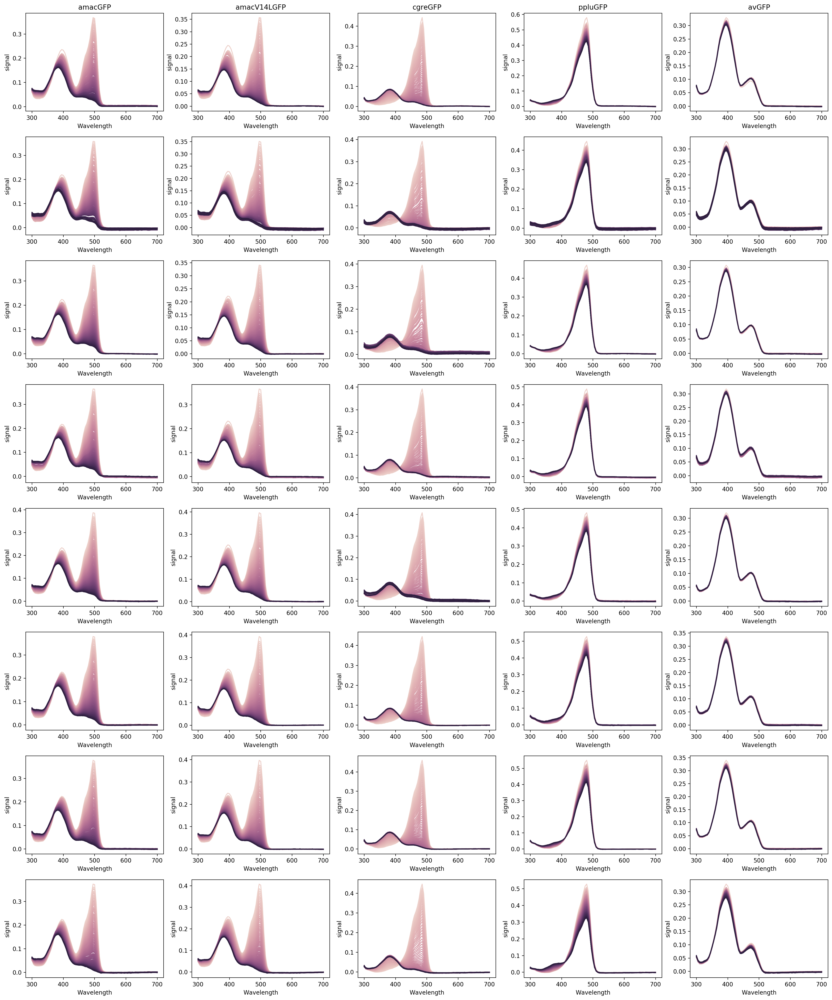

In [6]:
plot_all_spectra_replicates(dataset = spectra_abs, treatment = 'urea')

### Control: PBS (1X)

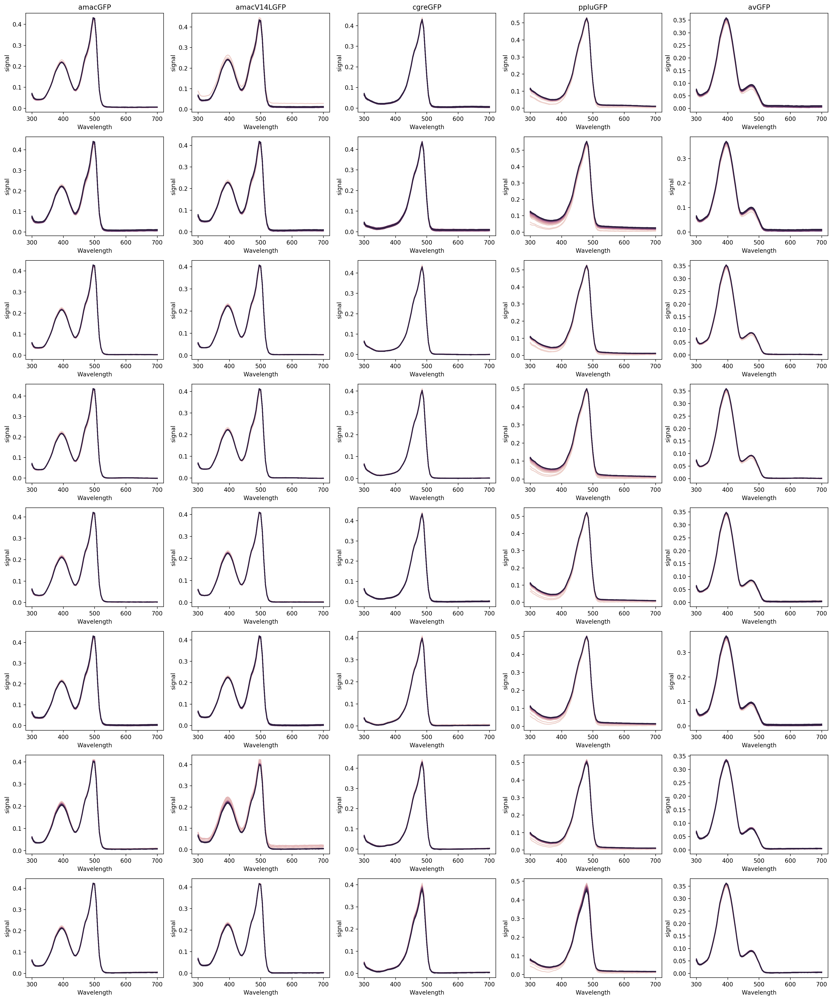

In [10]:
plot_all_spectra_replicates(dataset = spectra_abs, treatment = 'pbs')

### Decrease of maximum fluorescence with time

In [33]:
spectra_abs['hours'] = spectra_abs['t'] * 40 / 60 #each fluorescence spectrum measurement takes ~25min

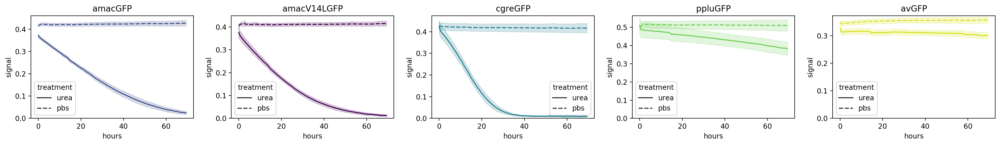

In [35]:
axes = subplots(height=3, width=4, nplots=5, nplots_per_row=5)
for ax,gene in zip(axes,['amac','amacV14L','cgre','pplu','av']):
    plt.sca(ax)
    sns.lineplot(data=spectra_abs[(spectra_abs.peak==True) & (spectra_abs.gene==gene)], 
                 x='hours', y='signal', color=colors[gene], style='treatment', ci='sd')
    plt.title(gene+'GFP')
    plt.ylim(bottom=0)
plt.tight_layout()

# Fluorescence spectra (timecourse)

Measured on a Biotek SynergyH1 plate reader, in 5nm steps. Approximately 25min needed to complete one full spectrum measurement (450-700nm).

Excitation wavelength: 420nm.

Sample volume: 200ul. Sample concentration: ~0.15uM purified GFP protein.

### In 9M urea

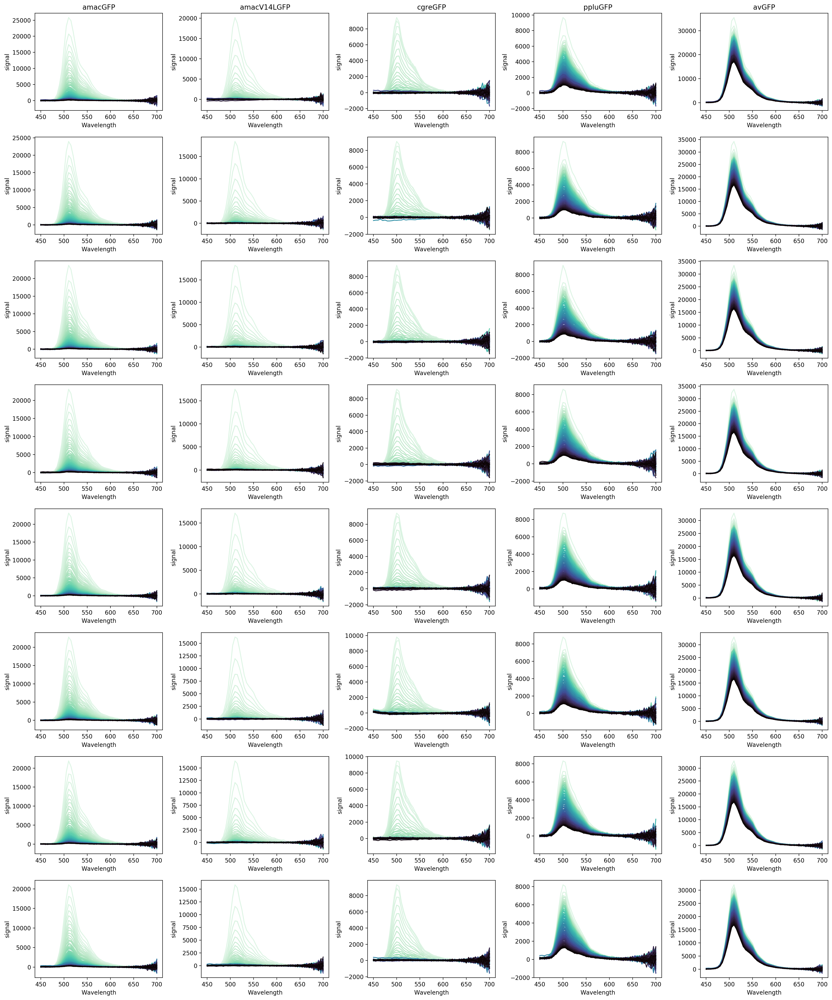

In [13]:
plot_all_spectra_replicates(dataset = spectra_fluo, treatment = 'urea', palette='mako_r')

### In PBS (1X)

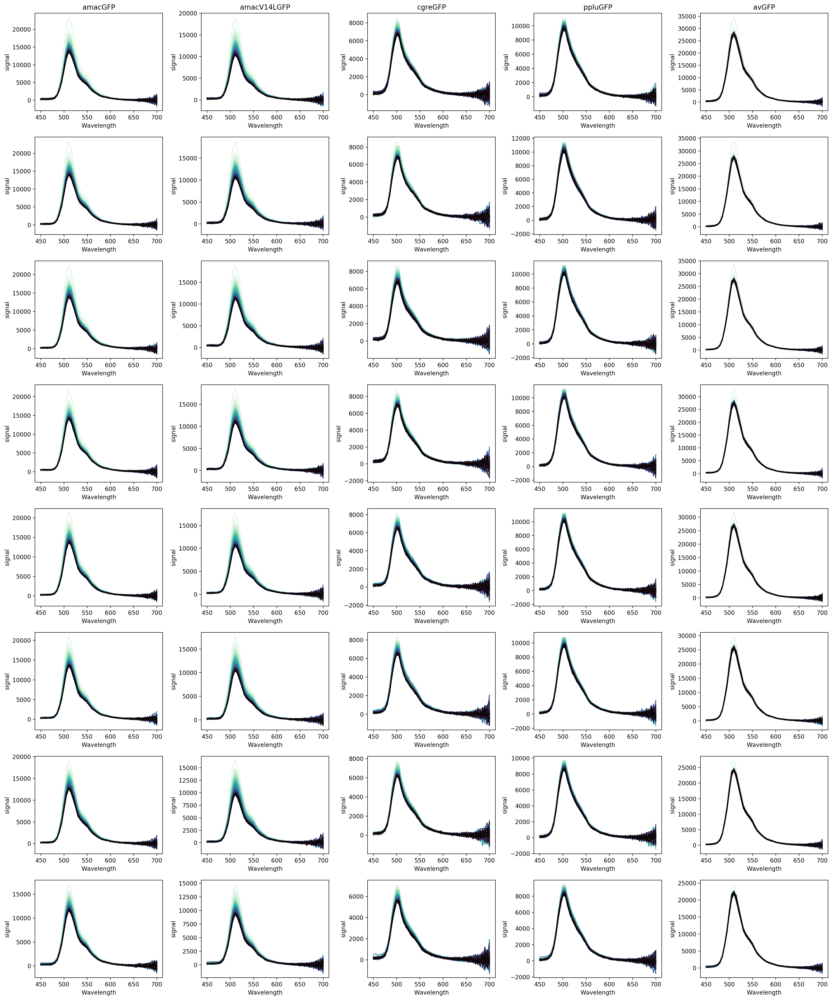

In [14]:
plot_all_spectra_replicates(dataset = spectra_fluo, treatment = 'pbs', palette='mako_r')

### Decrease of maximum fluorescence with time

In [15]:
spectra_fluo['hours'] = spectra_fluo['t'] * 25 / 60 #each fluorescence spectrum measurement takes ~25min

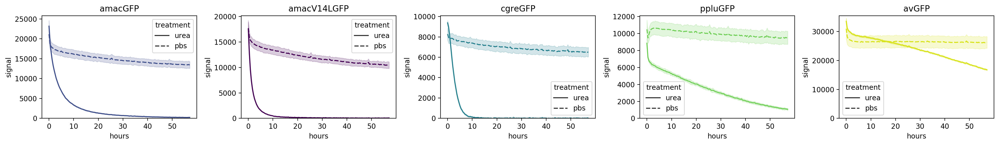

In [36]:
axes = subplots(height=3, width=4, nplots=5, nplots_per_row=5)
for ax,gene in zip(axes,['amac','amacV14L','cgre','pplu','av']):
    plt.sca(ax)
    sns.lineplot(data=spectra_fluo[(spectra_fluo.peak==True) & (spectra_fluo.gene==gene)], 
                 x='hours', y='signal', color=colors[gene], style='treatment', ci='sd')
    plt.title(gene+'GFP')
    plt.ylim(bottom=0)
plt.tight_layout()

# Temperature sensitivity

In [17]:
temperature_data = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                                            'temperature__qPCR_raw_data.txt'), sep='\t')
temperature_data = temperature_data[temperature_data['SampleName'].str.contains('av|pplu|cgre|amac|amacV14L')].copy()
temperature_data['Time'] = temperature_data['Time']/1000
temperature_data['temperature'] = round(temperature_data['Temp'])

melting = pd.read_csv(os.path.join(structure_folder, 'stability_measurements',
                                            'temperature__qPCR_melting_temperatures.txt'), sep='\t')
melting = {'av':melting[(melting['Name']=='av')]['Tm1'].mean(),
             'amac':melting[(melting['Name']=='amac')]['Tm1'].mean(),
             'amacV14L':melting[(melting['Name']=='amacV14L')]['Tm1'].mean(),
             'cgre':melting[(melting['Name']=='cgre')]['Tm1'].mean(),
             'pplu':melting[(melting['Name']=='pplu')]['Tm1'].mean(),}

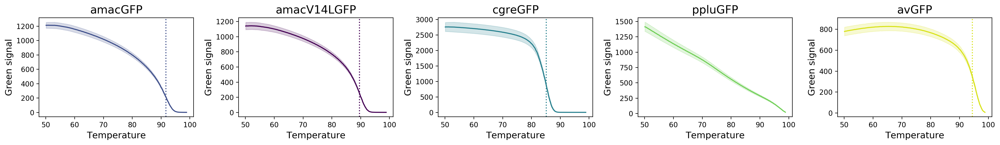

In [27]:
axes = subplots(height=3, width=4, nplots=5, nplots_per_row=5)
for ax,gene in zip(axes,['amac','amacV14L','cgre','pplu','av']):
    plt.sca(ax)
    sns.lineplot(data=temperature_data[(temperature_data['SampleName']==gene) & (temperature_data['Temp']>50)], 
             x='Temp', y='465-510', ci='sd', color=colors[gene])
    plt.axvline(melting[gene], color=colors[gene], ls=':')
    label_plot_axis(x='Temperature', y='Green signal', t=gene+'GFP')
plt.tight_layout()